In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
from __future__ import print_function
import argparse
import os

import numpy as np
from keras import backend as K
from keras.callbacks import ModelCheckpoint
from keras.models import Model
from keras.layers import Input
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Concatenate
from keras.layers import merge
from keras.optimizers import Adam, SGD, RMSprop
from keras.preprocessing.image import list_pictures, array_to_img

from image_ext import list_pictures_in_multidir, load_imgs_asarray

import pickle

np.random.seed(2016)

Using TensorFlow backend.


In [2]:
def create_fcn00(input_size):
    inputs = Input((3, input_size[1], input_size[0]))

    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_first')(inputs)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2), data_format='channels_first')(conv1)

    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same', data_format='channels_first')(pool1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2), data_format='channels_first')(conv2)

    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same', data_format='channels_first')(pool2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2), data_format='channels_first')(conv3)

    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same', data_format='channels_first')(pool3)
    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2), data_format='channels_first')(conv4)

    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same', data_format='channels_first')(pool4)
    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv5)
    pool5 = MaxPooling2D(pool_size=(2, 2), data_format='channels_first')(conv5)

    conv6 = Conv2D(1024, (3, 3), activation='relu', padding='same', data_format='channels_first')(pool5)
    conv6 = Conv2D(1024, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv6)

    up7 = Concatenate(axis=1)([UpSampling2D(size=(2, 2), data_format='channels_first')(conv6), conv5])
    conv7 = Conv2D(512, (3, 3), activation='relu', padding='same', data_format='channels_first')(up7)
    conv7 = Conv2D(512, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv7)

    up8 = Concatenate(axis=1)([UpSampling2D(size=(2, 2), data_format='channels_first')(conv7), conv4])
    conv8 = Conv2D(256, (3, 3), activation='relu', padding='same', data_format='channels_first')(up8)
    conv8 = Conv2D(256, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv8)

    up9 = Concatenate(axis=1)([UpSampling2D(size=(2, 2), data_format='channels_first')(conv8), conv3])
    conv9 = Conv2D(128, (3, 3), activation='relu', padding='same', data_format='channels_first')(up9)
    conv9 = Conv2D(128, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv9)

    up10 = Concatenate(axis=1)([UpSampling2D(size=(2, 2), data_format='channels_first')(conv9), conv2])
    conv10 = Conv2D(64, (3, 3), activation='relu', padding='same', data_format='channels_first')(up10)
    conv10 = Conv2D(64, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv10)

    up11 = Concatenate(axis=1)([UpSampling2D(size=(2, 2), data_format='channels_first')(conv10), conv1])
    conv11 = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_first')(up11)
    conv11 = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv11)

    conv12 = Conv2D(1, (1, 1), activation='sigmoid', padding='same', data_format='channels_first')(conv11)
    #conv12 = Conv2D(1, 1, 1)(conv11)
    
    fcn = Model(inputs=inputs, outputs=conv12)

    return fcn

In [3]:
def create_fcn01(input_size):
    inputs = Input((3, input_size[1], input_size[0]))

    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_first')(inputs)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2), data_format='channels_first')(conv1)

    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same', data_format='channels_first')(pool1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2), data_format='channels_first')(conv2)

    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same', data_format='channels_first')(pool2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2), data_format='channels_first')(conv3)

    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same', data_format='channels_first')(pool3)
    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2), data_format='channels_first')(conv4)

    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same', data_format='channels_first')(pool4)
    conv6 = Conv2D(512, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv6)
    
    up8 = Concatenate(axis=1)([UpSampling2D(size=(2, 2), data_format='channels_first')(conv6), conv4])
    conv8 = Conv2D(256, (3, 3), activation='relu', padding='same', data_format='channels_first')(up8)
    conv8 = Conv2D(256, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv8)

    up9 = Concatenate(axis=1)([UpSampling2D(size=(2, 2), data_format='channels_first')(conv8), conv3])
    conv9 = Conv2D(128, (3, 3), activation='relu', padding='same', data_format='channels_first')(up9)
    conv9 = Conv2D(128, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv9)

    up10 = Concatenate(axis=1)([UpSampling2D(size=(2, 2), data_format='channels_first')(conv9), conv2])
    conv10 = Conv2D(64, (3, 3), activation='relu', padding='same', data_format='channels_first')(up10)
    conv10 = Conv2D(64, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv10)

    up11 = Concatenate(axis=1)([UpSampling2D(size=(2, 2), data_format='channels_first')(conv10), conv1])
    conv11 = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_first')(up11)
    conv11 = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv11)

    conv12 = Conv2D(1, (1, 1), activation='sigmoid', padding='same', data_format='channels_first')(conv11)
    #conv12 = Conv2D(1, 1, 1)(conv11)
    
    fcn = Model(inputs=inputs, outputs=conv12)

    return fcn

In [4]:
def create_fcn02(input_size):
    inputs = Input((3, input_size[1], input_size[0]))

    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_first')(inputs)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2), data_format='channels_first')(conv1)

    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same', data_format='channels_first')(pool1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2), data_format='channels_first')(conv2)

    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same', data_format='channels_first')(pool2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2), data_format='channels_first')(conv3)

    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same', data_format='channels_first')(pool3)
    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv4)

    up9 = Concatenate(axis=1)([UpSampling2D(size=(2, 2), data_format='channels_first')(conv4), conv3])
    conv9 = Conv2D(128, (3, 3), activation='relu', padding='same', data_format='channels_first')(up9)
    conv9 = Conv2D(128, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv9)

    up10 = Concatenate(axis=1)([UpSampling2D(size=(2, 2), data_format='channels_first')(conv9), conv2])
    conv10 = Conv2D(64, (3, 3), activation='relu', padding='same', data_format='channels_first')(up10)
    conv10 = Conv2D(64, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv10)

    up11 = Concatenate(axis=1)([UpSampling2D(size=(2, 2), data_format='channels_first')(conv10), conv1])
    conv11 = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_first')(up11)
    conv11 = Conv2D(32, (3, 3), activation='relu', padding='same', data_format='channels_first')(conv11)

    conv12 = Conv2D(1, (1, 1), activation='sigmoid', padding='same', data_format='channels_first')(conv11)
    #conv12 = Conv2D(1, 1, 1)(conv11)
    
    fcn = Model(inputs=inputs, outputs=conv12)

    return fcn

In [5]:
def dice_coef(y_true, y_pred):
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)
    intersection = K.sum(y_true * y_pred)
    return (2.*intersection + 1) / (K.sum(y_true) + K.sum(y_pred) + 1)

def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

In [6]:
def load_fnames(paths):
    f = open(paths)
    data1 = f.read()
    f.close()
    lines = data1.split('\n')
    #print(len(lines))
    # 最終行は空行なので消す
    del(lines[len(lines)-1])
    #print(len(lines))
    return lines

In [7]:
def make_fnames(fnames,fpath,fpath_mask,mask_ext):
    fnames_img = [];
    fnames_mask= [];
    
    for i in range(len(fnames)):
        fnames_img.append(fpath + '/' + fnames[i]);
        fnames_mask.append(fpath_mask + '/' + mask_ext + fnames[i]);
        
    return [fnames_img,fnames_mask]

In [8]:
#
#  MAIN STARTS FROM HERE
#
if __name__ == '__main__':
    
    target_size = (224, 224)
    dpath_this = './'
    dname_checkpoints = 'checkpoints01'
    dname_outputs = 'outputs'
    fname_architecture = 'architecture.json'
    fname_weights = "model_weights_{epoch:02d}.h5"
    fname_stats = 'stats01.npz'
    dim_ordering = 'channels_first'
    fname_history = "history.pkl"

    # definision of mode, LEARN or TEST
    mode = "TEST"

    # モデルを作成
    print('creating model...')
    model = create_fcn02(target_size)
    model.summary()    

creating model...
____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
input_1 (InputLayer)             (None, 3, 224, 224)   0                                            
____________________________________________________________________________________________________
conv2d_1 (Conv2D)                (None, 32, 224, 224)  896         input_1[0][0]                    
____________________________________________________________________________________________________
conv2d_2 (Conv2D)                (None, 32, 224, 224)  9248        conv2d_1[0][0]                   
____________________________________________________________________________________________________
max_pooling2d_1 (MaxPooling2D)   (None, 32, 112, 112)  0           conv2d_2[0][0]                   
_________________________________________________________________________

In [11]:
#
#   LEARNING MODE
#
if mode == "LEARN":
    # Read Learning Data
    fnames = load_fnames('data/list_train_01.txt')
    [fpaths_xs_train,fpaths_ys_train] = make_fnames(fnames,'data/img','data/mask','OperatorA_')

    X_train = load_imgs_asarray(fpaths_xs_train, grayscale=False, target_size=target_size,
                                dim_ordering=dim_ordering)
    Y_train = load_imgs_asarray(fpaths_ys_train, grayscale=True, target_size=target_size,
                                dim_ordering=dim_ordering) 

    # Read Validation Data
    fnames = load_fnames('data/list_valid_01.txt')
    [fpaths_xs_valid,fpaths_ys_valid] = make_fnames(fnames,'data/img','data/mask','OperatorA_')

    X_valid = load_imgs_asarray(fpaths_xs_valid, grayscale=False, target_size=target_size,
                                dim_ordering=dim_ordering)
    Y_valid = load_imgs_asarray(fpaths_ys_valid, grayscale=True, target_size=target_size,
                                dim_ordering=dim_ordering)     

IndentationError: unexpected indent (<ipython-input-11-b9246c8023ae>, line 4)

In [12]:
    print('==> ' + str(len(X_train)) + ' training images loaded')
    print('==> ' + str(len(Y_train)) + ' training masks loaded')
    print('==> ' + str(len(X_valid)) + ' validation images loaded')
    print('==> ' + str(len(Y_valid)) + ' validation masks loaded')

NameError: name 'X_train' is not defined

In [14]:
    # 前処理
    print('computing mean and standard deviation...')
    mean = np.mean(X_train, axis=(0, 2, 3))
    std = np.std(X_train, axis=(0, 2, 3))
    print('==> mean: ' + str(mean))
    print('==> std : ' + str(std))

    print('saving mean and standard deviation to ' + fname_stats + '...')
    stats = {'mean': mean, 'std': std}
    np.savez(fname_stats, **stats)
    print('==> done')

    print('globally normalizing data...')
    for i in range(3):
        X_train[:, i] = (X_train[:, i] - mean[i]) / std[i]
        X_valid[:, i] = (X_valid[:, i] - mean[i]) / std[i]
    Y_train /= 255
    Y_valid /= 255
    print('==> done')

computing mean and standard deviation...


NameError: name 'X_train' is not defined

In [15]:
    # 損失関数，最適化手法を定義
    adam = Adam(lr=1e-5)
    sgd = SGD(lr=0.01, decay=1e-6, momentum=0.1, nesterov=True)
    #rmsprop = RMSprop(lr=0.001, rho=0.9, epsilon=1e-08, decay=0.0)
    model.compile(optimizer=adam, loss=dice_coef_loss, metrics=[dice_coef])

    # 構造・重みを保存するディレクトリーの有無を確認
    dpath_checkpoints = os.path.join(dpath_this, dname_checkpoints)
    if not os.path.isdir(dpath_checkpoints):
        os.mkdir(dpath_checkpoints)
    # モデルの構造を保存
    json_string = model.to_json()
    fpath_architecture = os.path.join(dpath_checkpoints, fname_architecture)
    with open(fpath_architecture, "w", encoding="utf8") as f:
        f.write(json_string)
    # 重みを保存するためのオブジェクトを用意
    fpath_weights = os.path.join(dpath_checkpoints, fname_weights)
    checkpointer = ModelCheckpoint(filepath=fpath_weights, save_best_only=False)           

In [16]:
    # トレーニングを開始
    print('start training...')
    history = model.fit(X_train, Y_train, batch_size=32, epochs=100, verbose=1,
                  shuffle=True, validation_data=(X_valid, Y_valid), callbacks=[checkpointer])

start training...


NameError: name 'X_train' is not defined

In [17]:
    # Save History
    f = open(dname_checkpoints + '/' + fname_history,'wb')
    pickle.dump(history.history,f)
    f.close

NameError: name 'history' is not defined

In [9]:
#
#  TEST MODE
#
if mode == "TEST":
    # Prediction (test) mode

    # 学習済みの重みをロード
    epoch = 299
    fname_weights = 'model_weights_%02d.h5'%(epoch)
    fpath_weights = os.path.join(dname_checkpoints, fname_weights)
    model.load_weights(fpath_weights)
    print('==> done')

==> done


In [10]:
    # Read Test Data
    fnames = load_fnames('data/list_test_01.txt')

    [fpaths_xs_test,fpaths_ys_test] = make_fnames(fnames,'data/img','data/mask','OperatorA_')

    X_test = load_imgs_asarray(fpaths_xs_test, grayscale=False, target_size=target_size,
                                dim_ordering=dim_ordering)
    Y_test = load_imgs_asarray(fpaths_ys_test, grayscale=True, target_size=target_size,
                                dim_ordering=dim_ordering)


    # トレーニング時に計算した平均・標準偏差をロード    
    print('loading mean and standard deviation from ' + fname_stats + '...')
    stats = np.load(fname_stats)
    mean = stats['mean']
    std = stats['std']
    print('==> mean: ' + str(mean))
    print('==> std : ' + str(std))

    for i in range(3):
        X_test[:, i] = (X_test[:, i] - mean[i]) / std[i]
    print('==> done')

loading mean and standard deviation from stats01.npz...
==> mean: [ 130.65464783   91.26850128   76.63642883]
==> std : [ 55.28170013  43.99096298  43.11348343]
==> done


In [11]:
    # テストを開始
    outputs = model.predict(X_test)

In [12]:
    # 出力を画像として保存
    dname_outputs = './outputs/'
    if not os.path.isdir(dname_outputs):
        print('create directory: %s'%(dname_outputs))
        os.mkdir(dname_outputs)

    print('saving outputs as images...')
    n = 0
    for i, array in enumerate(outputs):
        array = np.where(array > 0.5, 1, 0) # 二値に変換
        array = array.astype(np.float32)
        img_out = array_to_img(array, dim_ordering)
        # fpath_out = os.path.join(dname_outputs, fnames[i])
        fpath_out = os.path.join(dname_outputs, "%05d.png"%(n))
        img_out.save(fpath_out)
        n = n + 1

    print('==> done')

saving outputs as images...
==> done


000: Dice Coeff = 0.766197


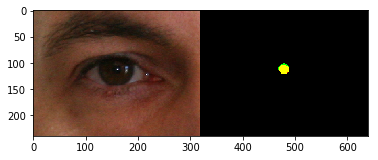

001: Dice Coeff = 0.600699


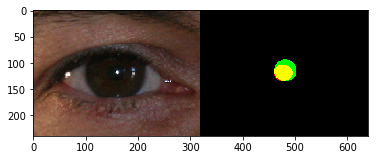

002: Dice Coeff = 0.775842


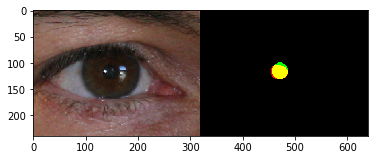

003: Dice Coeff = 0.675279


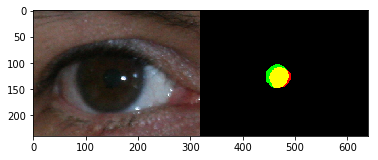

004: Dice Coeff = 0.553619


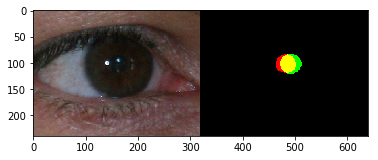

005: Dice Coeff = 0.635965


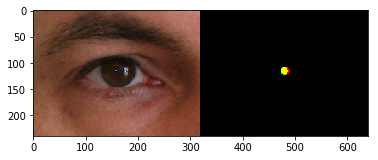

006: Dice Coeff = 0.724771


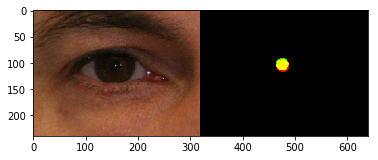

007: Dice Coeff = 0.607306


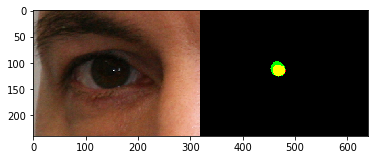

008: Dice Coeff = 0.889513


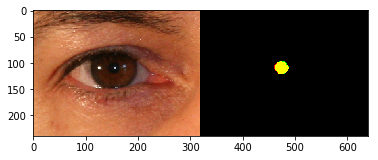

009: Dice Coeff = 0.829126


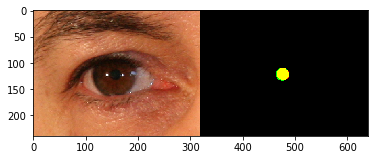

010: Dice Coeff = 0.840671


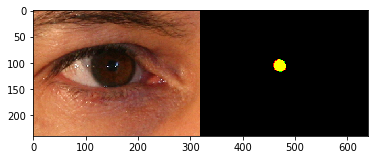

011: Dice Coeff = 0.260355


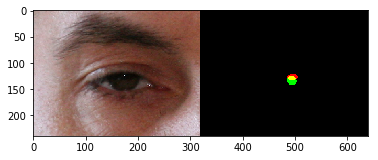

012: Dice Coeff = 0.710445


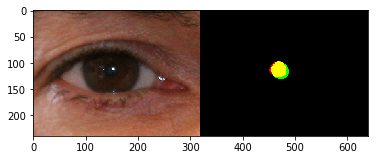

013: Dice Coeff = 0.867099


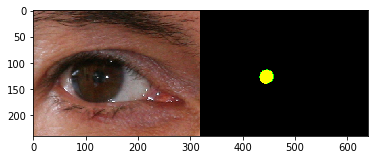

014: Dice Coeff = 0.450445


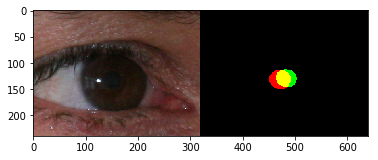

015: Dice Coeff = 0.736951


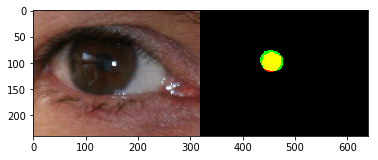

016: Dice Coeff = 0.720779


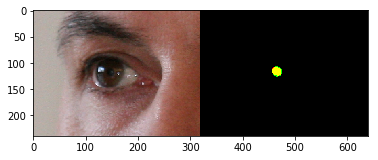

017: Dice Coeff = 0.891247


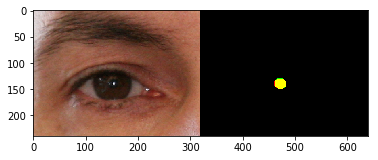

018: Dice Coeff = 0.775176


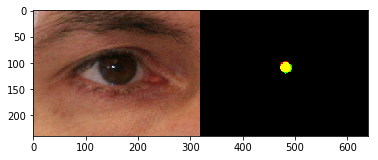

019: Dice Coeff = 0.762500


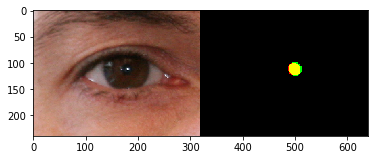

020: Dice Coeff = 0.753125


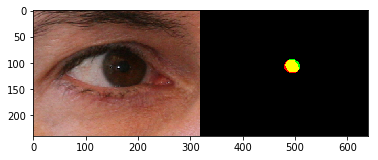

021: Dice Coeff = 0.729592


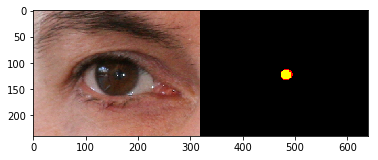

022: Dice Coeff = 0.666667


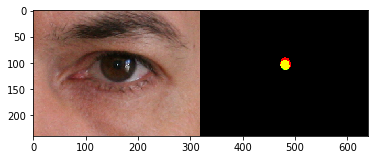

023: Dice Coeff = 0.907110


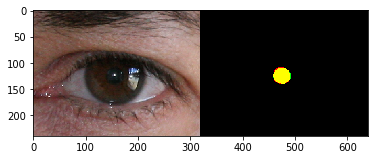

024: Dice Coeff = 0.872807


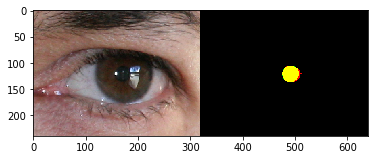

025: Dice Coeff = 0.773408


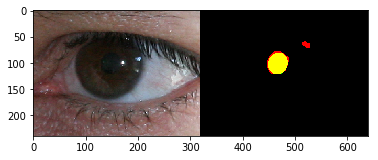

026: Dice Coeff = 0.893420


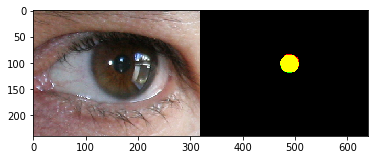

027: Dice Coeff = 0.746130


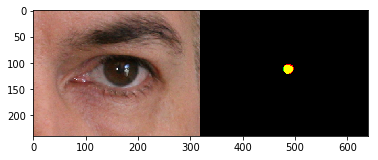

028: Dice Coeff = 0.818182


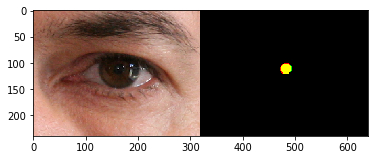

029: Dice Coeff = 0.659322


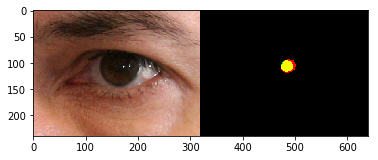

030: Dice Coeff = 0.740800


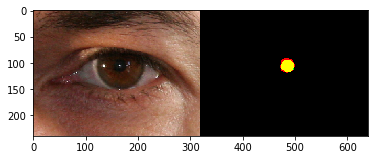

031: Dice Coeff = 0.829401


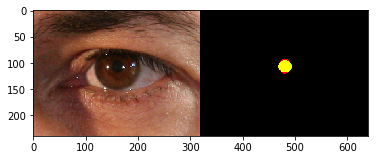

032: Dice Coeff = 0.744639


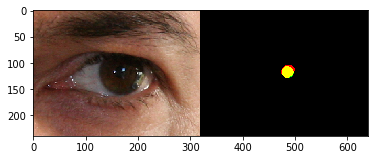

033: Dice Coeff = 0.673611


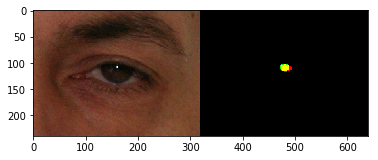

034: Dice Coeff = 0.758216


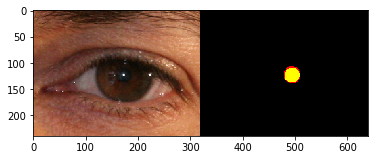

035: Dice Coeff = 0.853933


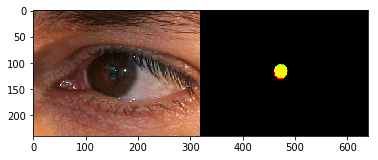

036: Dice Coeff = 0.805944


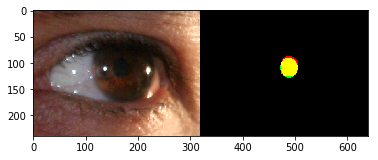

037: Dice Coeff = 0.783582


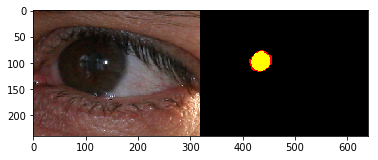

038: Dice Coeff = 0.567647


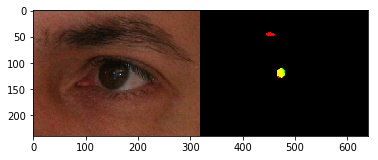

039: Dice Coeff = 0.746439


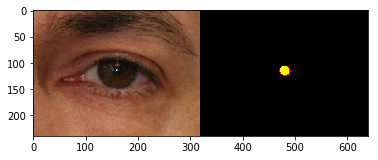

040: Dice Coeff = 0.744125


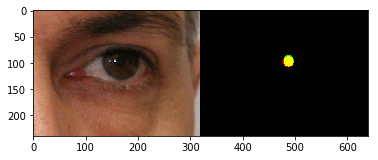

041: Dice Coeff = 0.854167


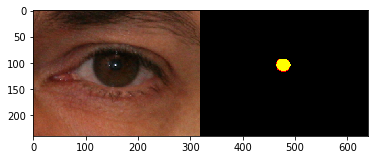

042: Dice Coeff = 0.870216


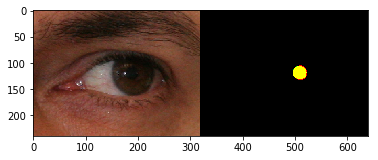

043: Dice Coeff = 0.718686


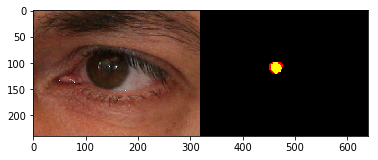

044: Dice Coeff = 0.709091


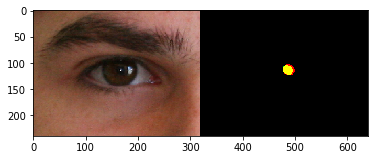

045: Dice Coeff = 0.700426


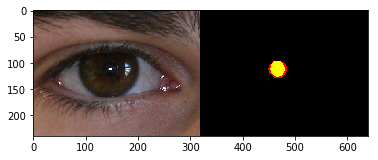

046: Dice Coeff = 0.704712


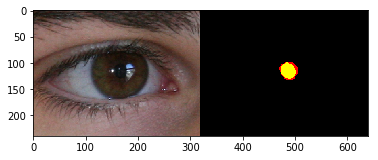

047: Dice Coeff = 0.831347


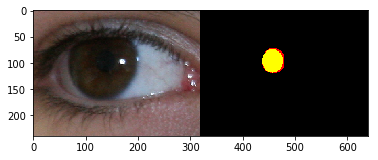

048: Dice Coeff = 0.822679


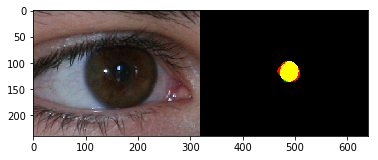

049: Dice Coeff = 0.685811


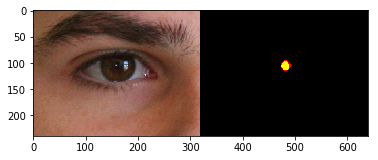

050: Dice Coeff = 0.786517


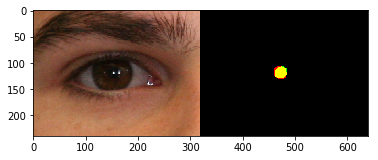

051: Dice Coeff = 0.627949


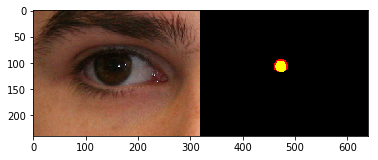

052: Dice Coeff = 0.805996


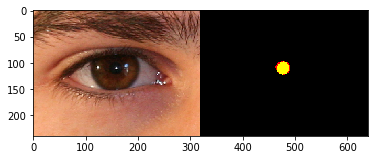

053: Dice Coeff = 0.848540


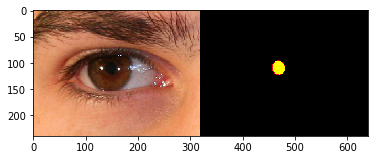

054: Dice Coeff = 0.870833


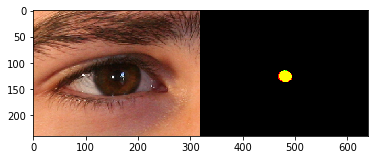

055: Dice Coeff = 0.754098


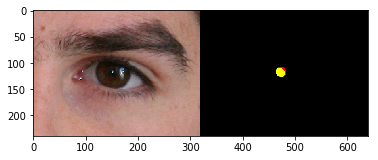

056: Dice Coeff = 0.817191


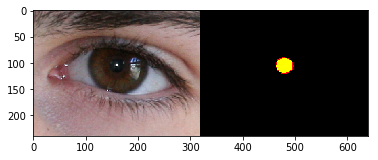

057: Dice Coeff = 0.722749


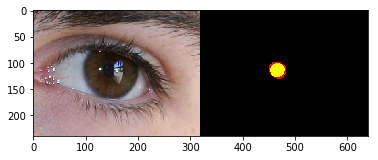

058: Dice Coeff = 0.818079


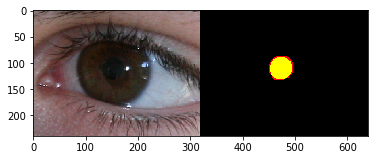

059: Dice Coeff = 0.850746


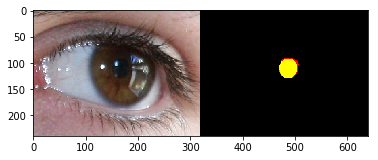

060: Dice Coeff = 0.825806


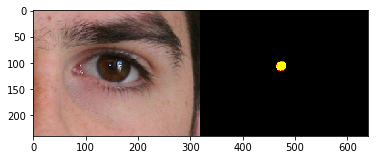

061: Dice Coeff = 0.760181


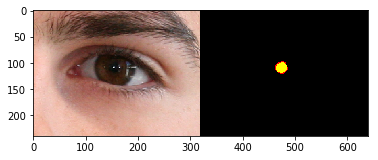

062: Dice Coeff = 0.735294


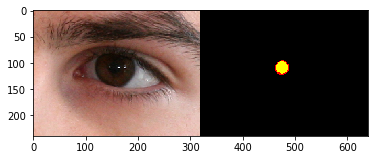

063: Dice Coeff = 0.771028


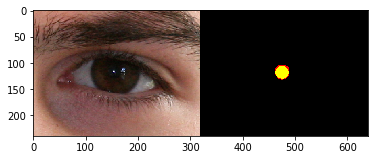

064: Dice Coeff = 0.612272


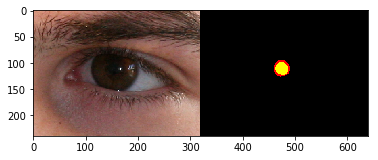

065: Dice Coeff = 0.767123


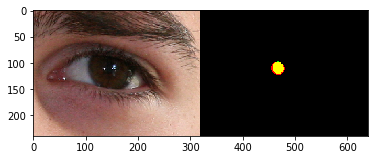

066: Dice Coeff = 0.641753


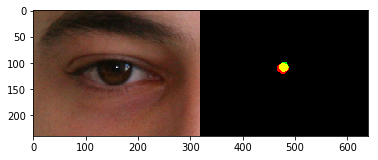

067: Dice Coeff = 0.711485


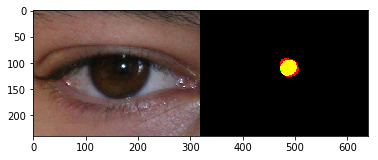

068: Dice Coeff = 0.759277


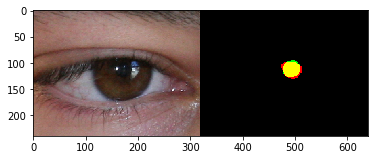

069: Dice Coeff = 0.454905


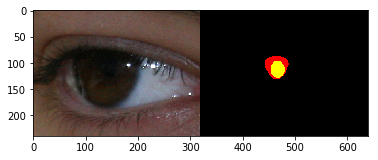

070: Dice Coeff = 0.743937


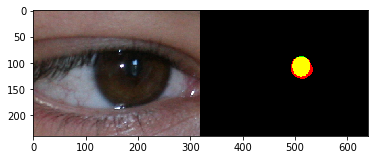

071: Dice Coeff = 0.699422


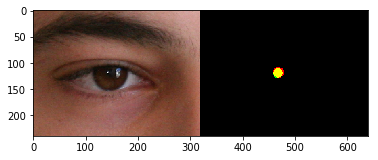

072: Dice Coeff = 0.769697


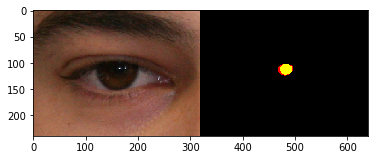

073: Dice Coeff = 0.680602


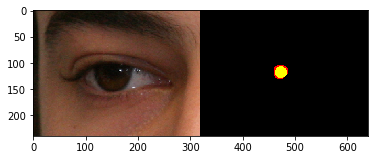

074: Dice Coeff = 0.713559


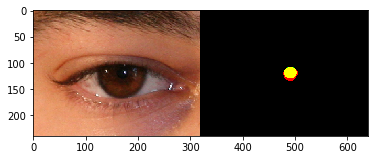

075: Dice Coeff = 0.726003


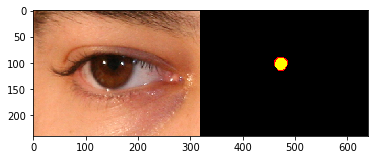

076: Dice Coeff = 0.526978


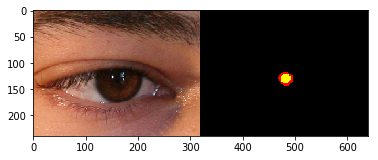

077: Dice Coeff = 0.682779


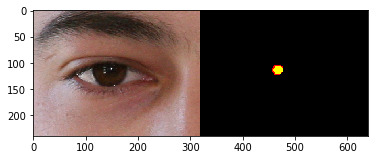

078: Dice Coeff = 0.524804


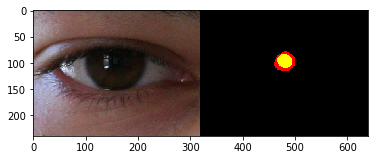

079: Dice Coeff = 0.841270


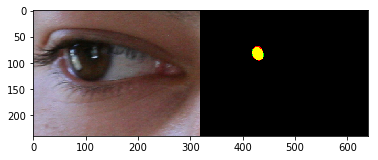

080: Dice Coeff = 0.521761


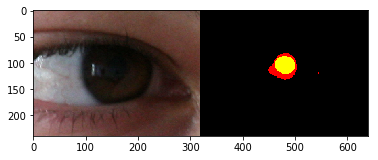

081: Dice Coeff = 0.415194


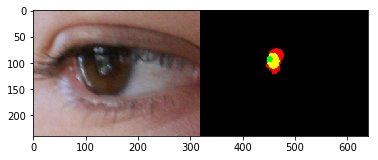

082: Dice Coeff = 0.474627


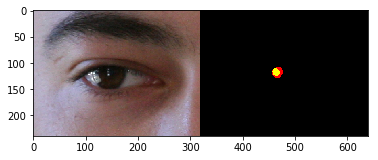

083: Dice Coeff = 0.666667


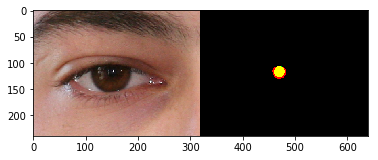

084: Dice Coeff = 0.662566


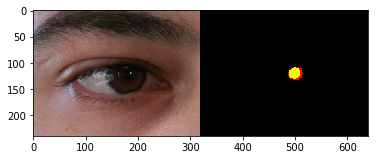

085: Dice Coeff = 0.641304


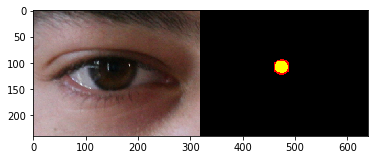

086: Dice Coeff = 0.564498


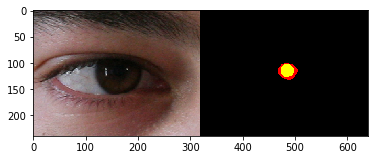

087: Dice Coeff = 0.511152


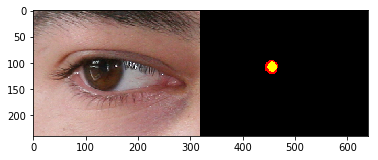

088: Dice Coeff = 0.800587


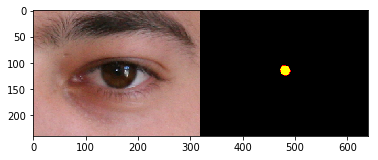

089: Dice Coeff = 0.681095


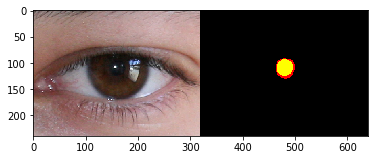

090: Dice Coeff = 0.736444


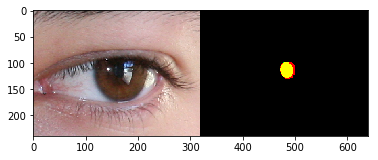

091: Dice Coeff = 0.806170


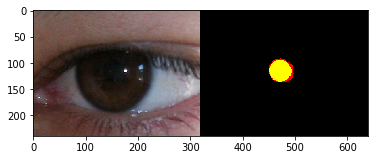

092: Dice Coeff = 0.884058


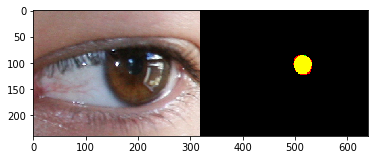

093: Dice Coeff = 0.655518


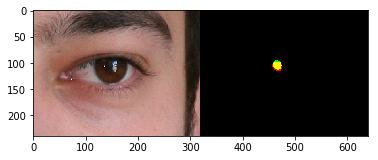

094: Dice Coeff = 0.764331


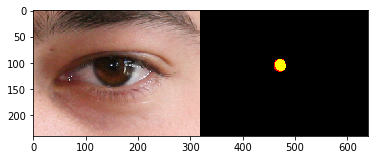

095: Dice Coeff = 0.392593


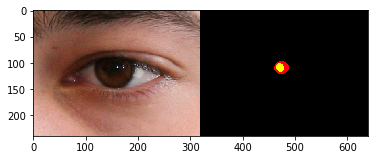

096: Dice Coeff = 0.581979


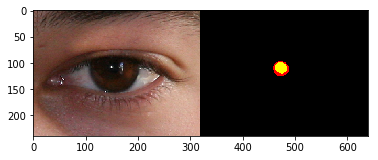

097: Dice Coeff = 0.744882


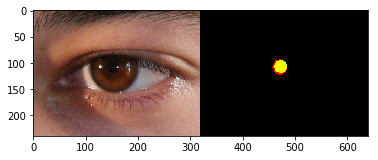

098: Dice Coeff = 0.641921


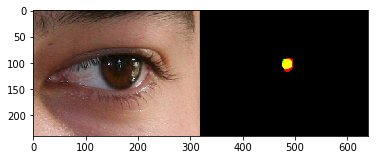

099: Dice Coeff = 0.565625


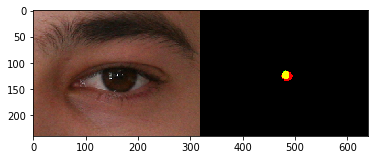

100: Dice Coeff = 0.508692


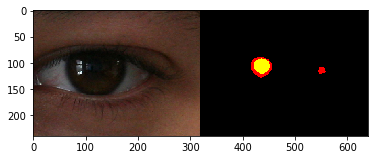

101: Dice Coeff = 0.418964


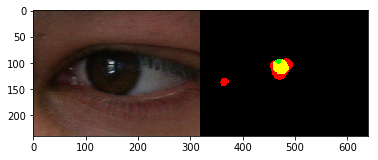

102: Dice Coeff = 0.328932


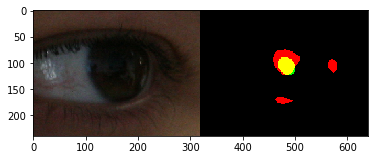

103: Dice Coeff = 0.368464


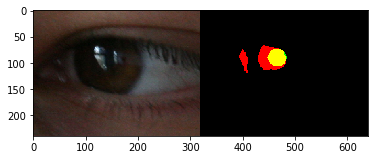

104: Dice Coeff = 0.383178


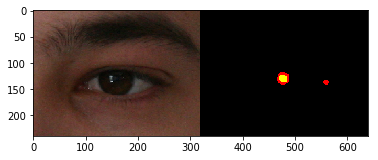

105: Dice Coeff = 0.511387


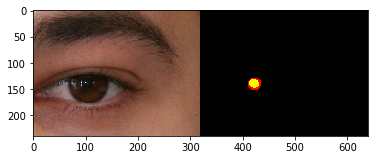

106: Dice Coeff = 0.456014


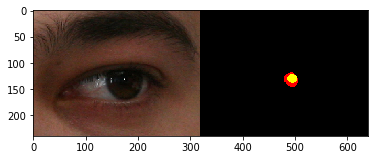

107: Dice Coeff = 0.503984


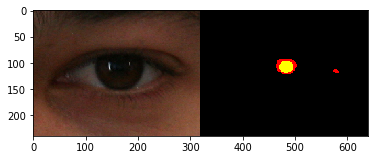

108: Dice Coeff = 0.626243


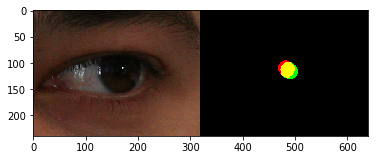

109: Dice Coeff = 0.465116


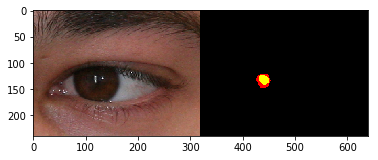

110: Dice Coeff = 0.641558


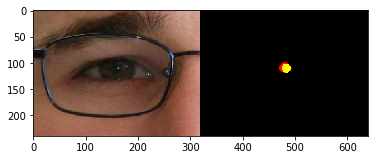

111: Dice Coeff = 0.771008


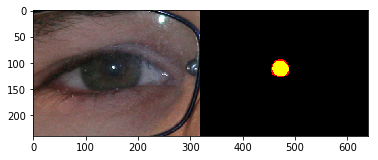

112: Dice Coeff = 0.600000


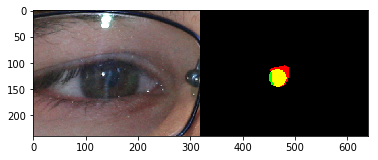

113: Dice Coeff = 0.727953


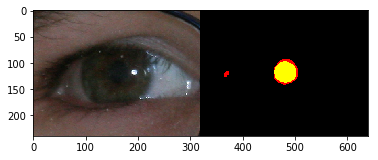

114: Dice Coeff = 0.786075


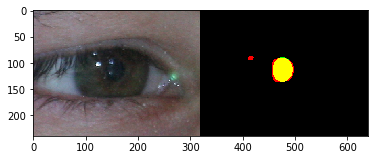

115: Dice Coeff = 0.549020


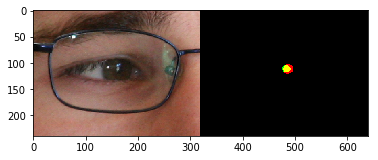

116: Dice Coeff = 0.751064


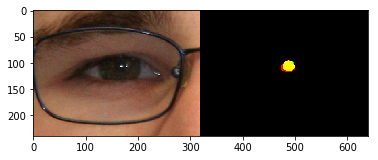

117: Dice Coeff = 0.419048


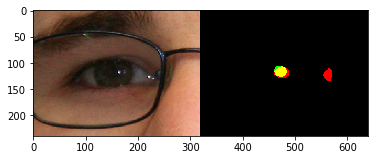

118: Dice Coeff = 0.772059


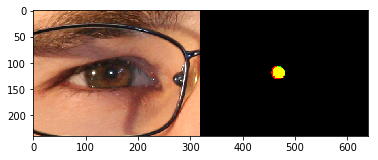

119: Dice Coeff = 0.779476


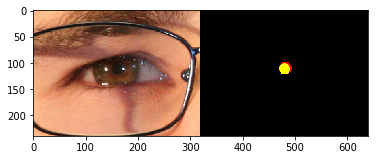

120: Dice Coeff = 0.690229


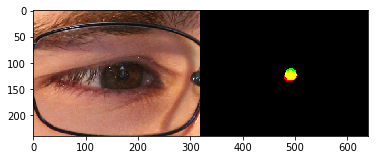

121: Dice Coeff = 0.667702


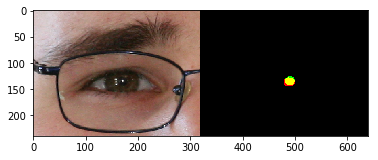

122: Dice Coeff = 0.712702


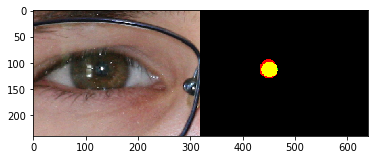

123: Dice Coeff = 0.638677


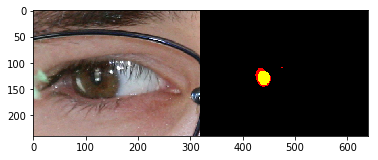

124: Dice Coeff = 0.725979


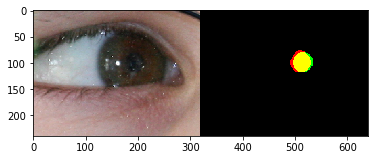

125: Dice Coeff = 0.735139


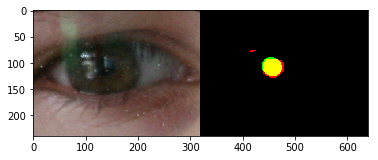

126: Dice Coeff = 0.511811


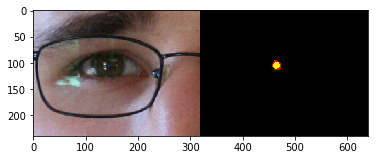

127: Dice Coeff = 0.662005


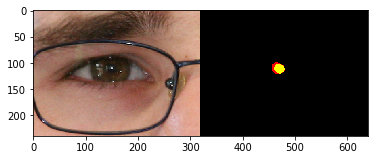

128: Dice Coeff = 0.616257


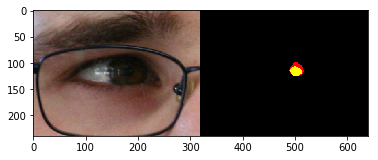

129: Dice Coeff = 0.541667


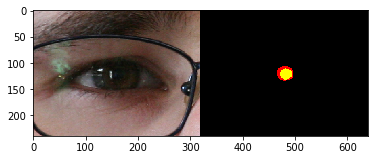

130: Dice Coeff = 0.756055


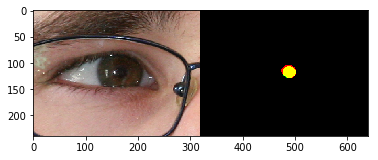

131: Dice Coeff = 0.514810


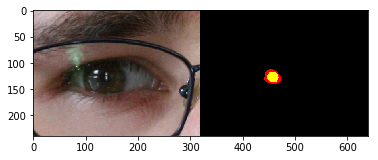

132: Dice Coeff = 0.796923


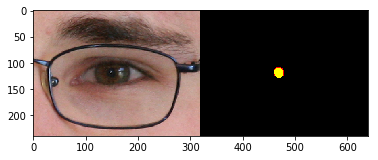

133: Dice Coeff = 0.733333


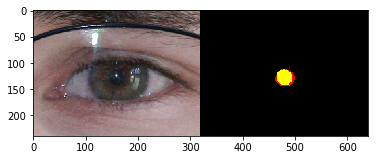

134: Dice Coeff = 0.664871


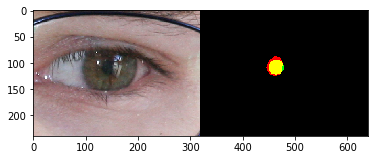

135: Dice Coeff = 0.704194


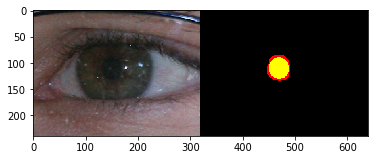

136: Dice Coeff = 0.770696


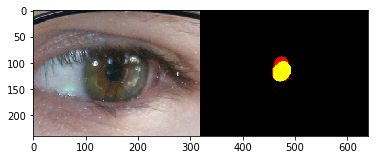

137: Dice Coeff = 0.213953


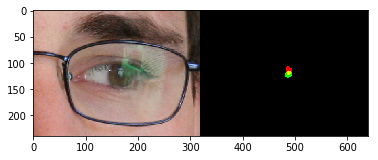

138: Dice Coeff = 0.897810


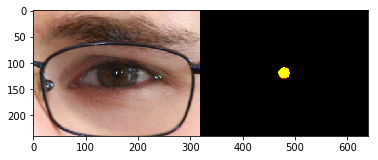

139: Dice Coeff = 0.748330


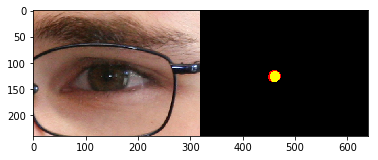

140: Dice Coeff = 0.782837


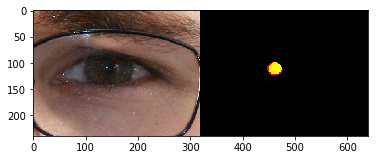

141: Dice Coeff = 0.208410


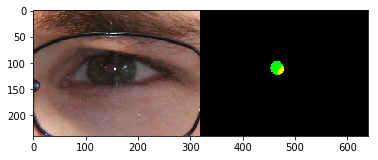

142: Dice Coeff = 0.703041


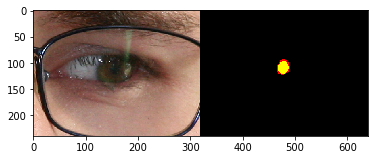

143: Dice Coeff = 0.714646


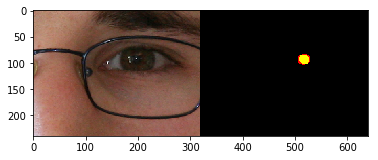

144: Dice Coeff = 0.696909


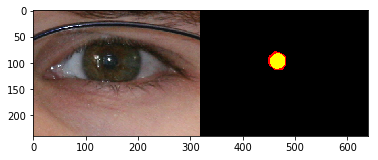

145: Dice Coeff = 0.740964


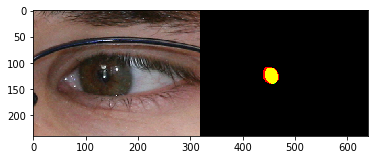

146: Dice Coeff = 0.742747


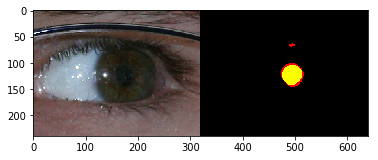

147: Dice Coeff = 0.279204


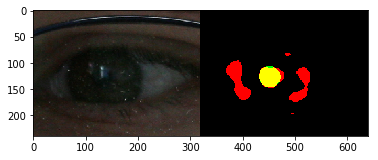

148: Dice Coeff = 0.554795


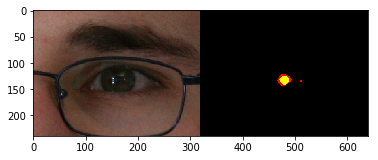

149: Dice Coeff = 0.589494


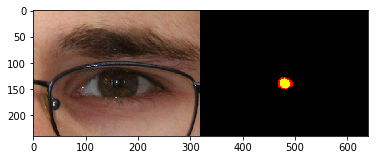

150: Dice Coeff = 0.508076


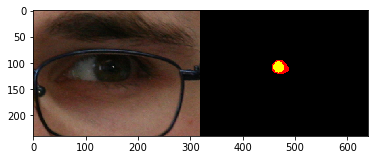

151: Dice Coeff = 0.486322


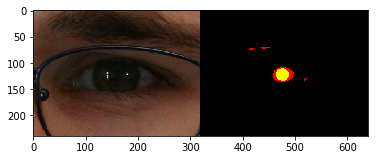

152: Dice Coeff = 0.687065


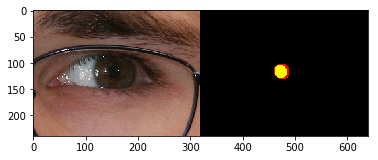

153: Dice Coeff = 0.234558


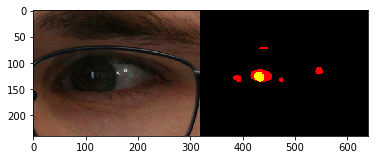

154: Dice Coeff = 0.705263


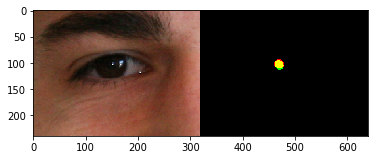

155: Dice Coeff = 0.595914


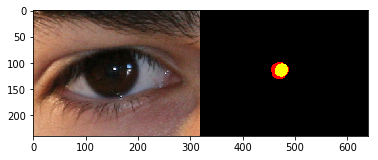

156: Dice Coeff = 0.630896


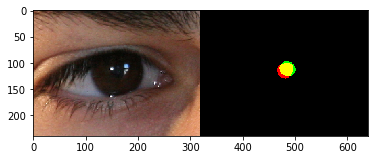

157: Dice Coeff = 0.438069


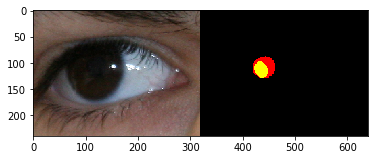

158: Dice Coeff = 0.803965


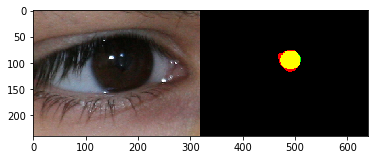

159: Dice Coeff = 0.505092


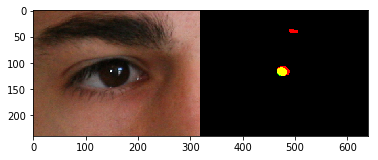

160: Dice Coeff = 0.524809


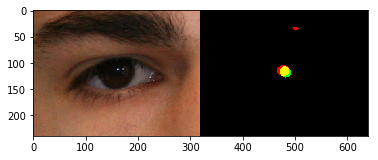

161: Dice Coeff = 0.517467


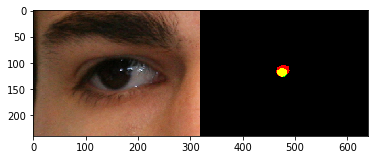

162: Dice Coeff = 0.676976


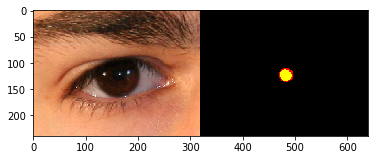

163: Dice Coeff = 0.706564


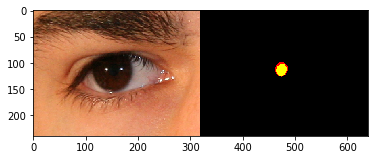

164: Dice Coeff = 0.651515


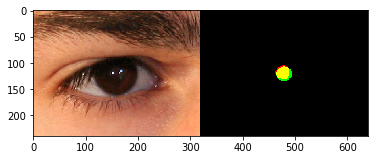

165: Dice Coeff = 0.573913


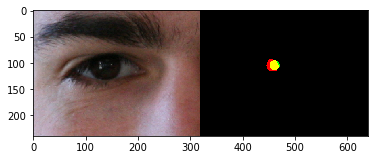

166: Dice Coeff = 0.671460


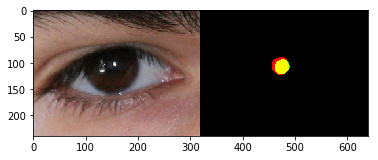

167: Dice Coeff = 0.753575


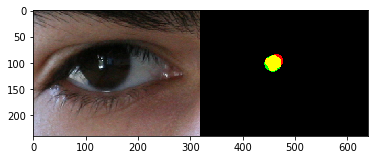

168: Dice Coeff = 0.617105


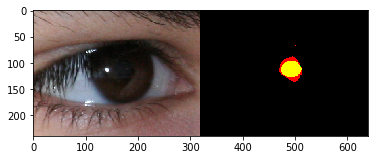

169: Dice Coeff = 0.540344


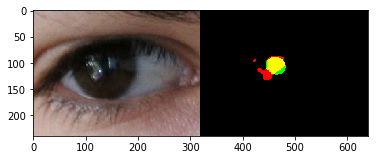

170: Dice Coeff = 0.255144


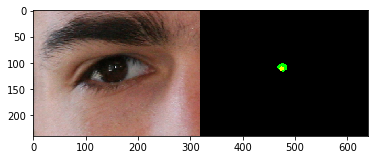

171: Dice Coeff = 0.593137


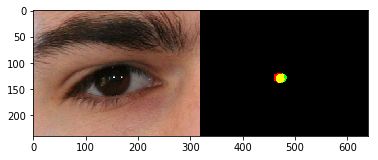

172: Dice Coeff = 0.620123


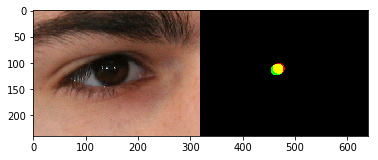

173: Dice Coeff = 0.622951


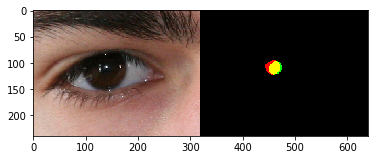

174: Dice Coeff = 0.734839


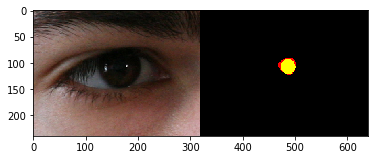

175: Dice Coeff = 0.744246


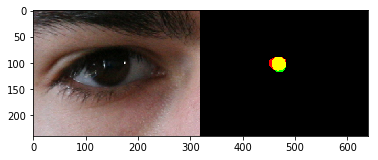

176: Dice Coeff = 0.677647


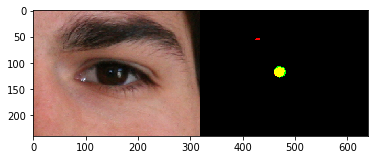

177: Dice Coeff = 0.792115


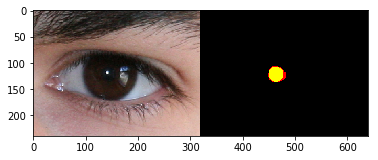

178: Dice Coeff = 0.743119


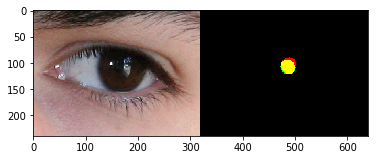

179: Dice Coeff = 0.821854


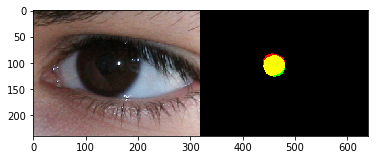

180: Dice Coeff = 0.811513


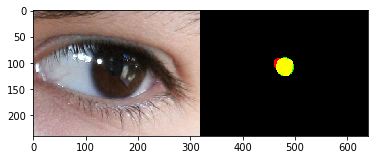

181: Dice Coeff = 0.514768


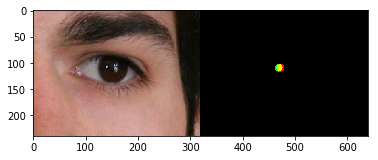

182: Dice Coeff = 0.618401


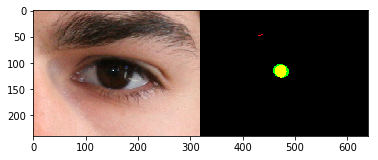

183: Dice Coeff = 0.447115


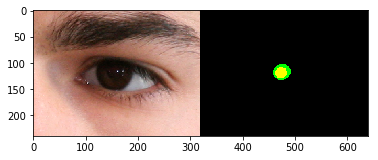

184: Dice Coeff = 0.655755


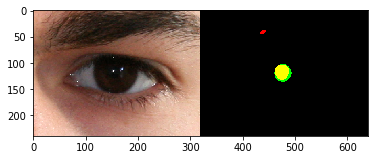

185: Dice Coeff = 0.767327


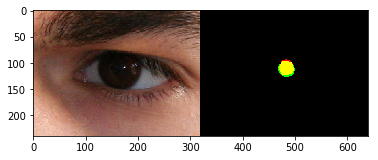

186: Dice Coeff = 0.481720


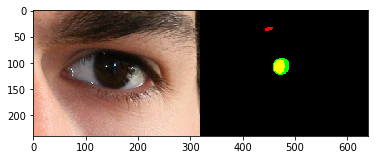

187: Dice Coeff = 0.582508


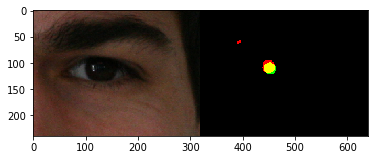

188: Dice Coeff = 0.803787


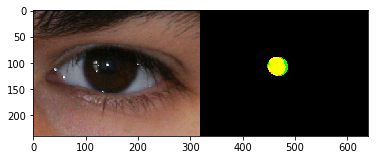

189: Dice Coeff = 0.729294


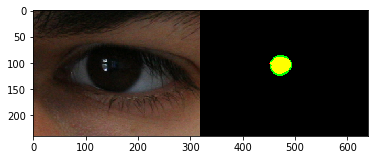

190: Dice Coeff = 0.574861


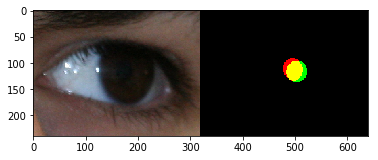

191: Dice Coeff = 0.390288


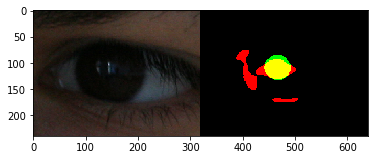

192: Dice Coeff = 0.473258


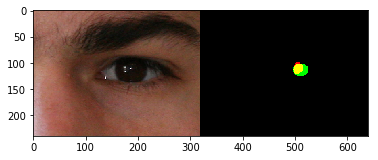

193: Dice Coeff = 0.740995


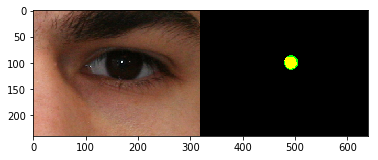

194: Dice Coeff = 0.331691


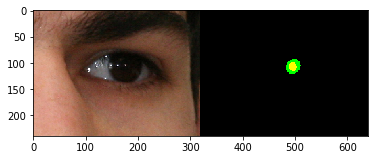

195: Dice Coeff = 0.585498


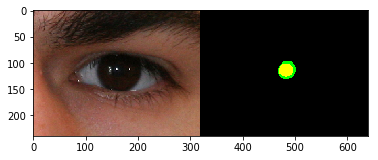

196: Dice Coeff = 0.808421


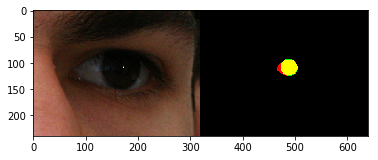

197: Dice Coeff = 0.598220


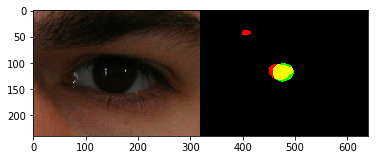

198: Dice Coeff = 0.779385


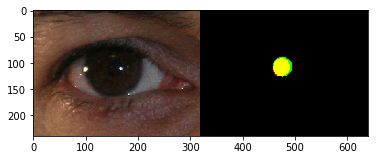

199: Dice Coeff = 0.788591


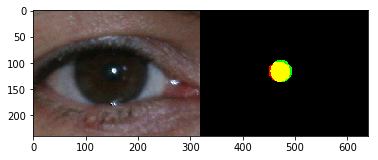

200: Dice Coeff = 0.841981


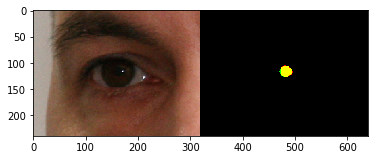

201: Dice Coeff = 0.673367


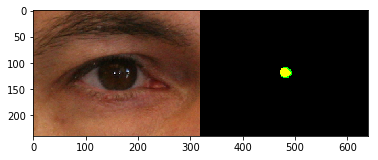

202: Dice Coeff = 0.504697


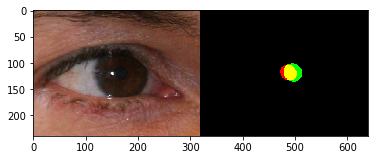

203: Dice Coeff = 0.738935


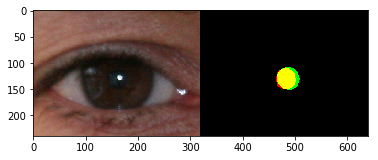

204: Dice Coeff = 0.784314


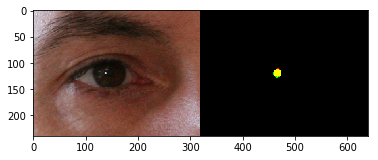

205: Dice Coeff = 0.848214


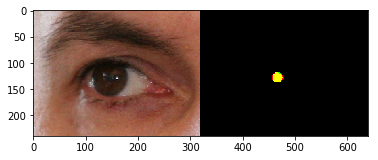

206: Dice Coeff = 0.790769


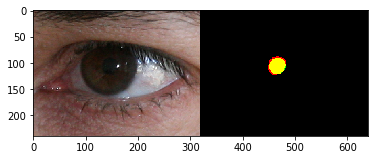

207: Dice Coeff = 0.863034


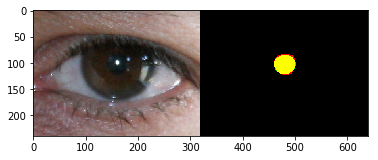

208: Dice Coeff = 0.754448


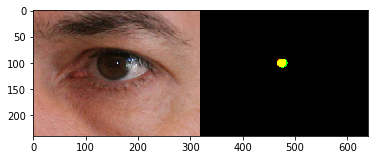

209: Dice Coeff = 0.858824


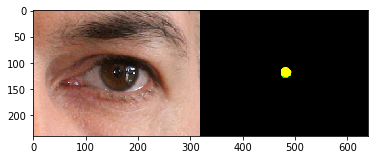

210: Dice Coeff = 0.798949


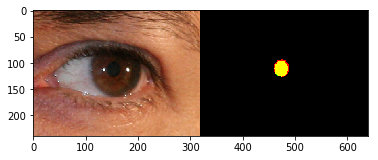

211: Dice Coeff = 0.817143


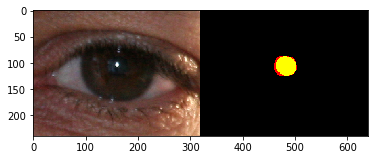

212: Dice Coeff = 0.532432


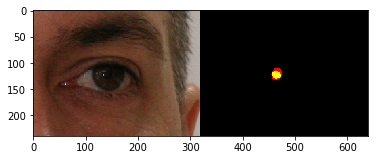

213: Dice Coeff = 0.581602


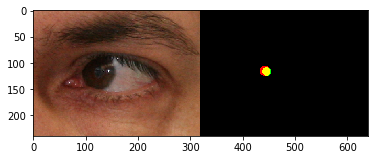

214: Dice Coeff = 0.697442


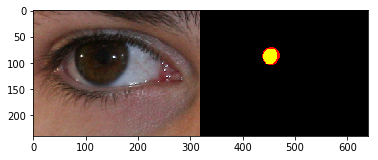

215: Dice Coeff = 0.835553


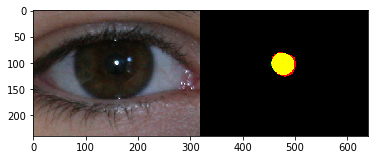

216: Dice Coeff = 0.549763


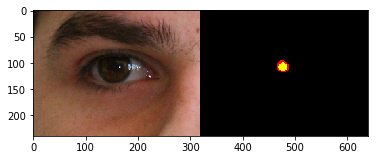

217: Dice Coeff = 0.642578


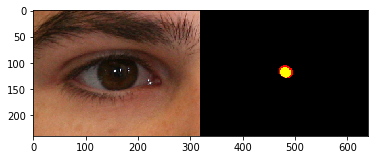

218: Dice Coeff = 0.765909


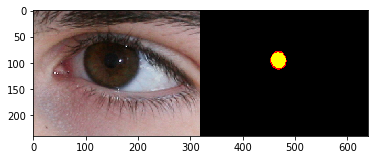

219: Dice Coeff = 0.911927


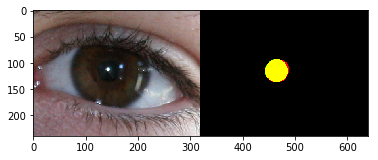

220: Dice Coeff = 0.826590


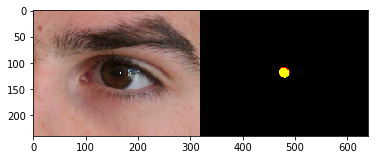

221: Dice Coeff = 0.827670


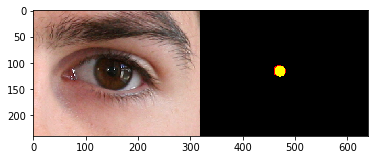

222: Dice Coeff = 0.632096


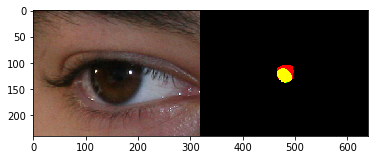

223: Dice Coeff = 0.736049


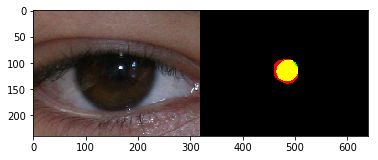

224: Dice Coeff = 0.555300


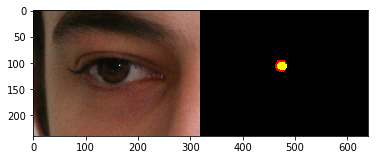

225: Dice Coeff = 0.678186


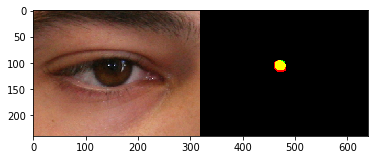

226: Dice Coeff = 0.596774


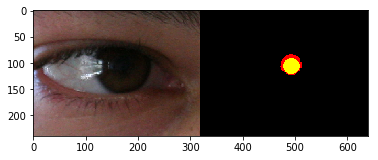

227: Dice Coeff = 0.882509


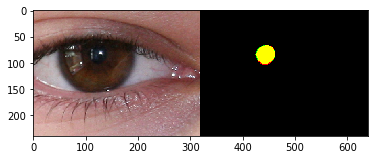

228: Dice Coeff = 0.612091


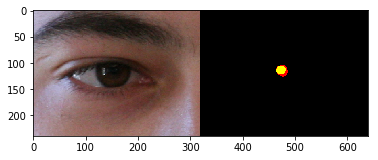

229: Dice Coeff = 0.658009


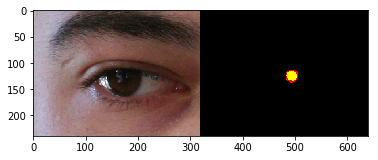

230: Dice Coeff = 0.734637


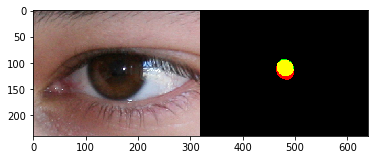

231: Dice Coeff = 0.883037


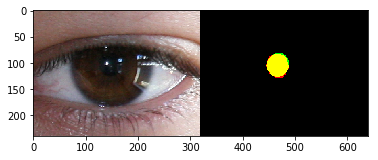

232: Dice Coeff = 0.488439


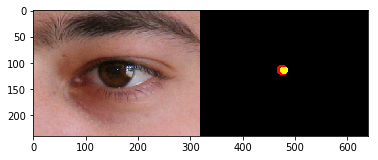

233: Dice Coeff = 0.637883


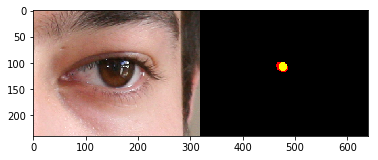

234: Dice Coeff = 0.648381


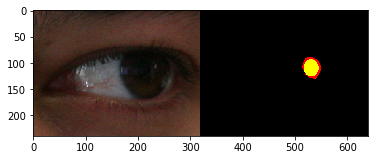

235: Dice Coeff = 0.779078


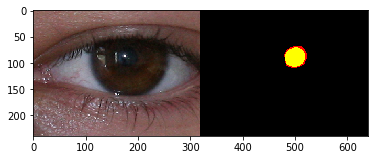

236: Dice Coeff = 0.560847


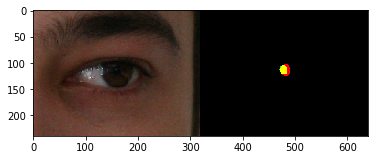

237: Dice Coeff = 0.294675


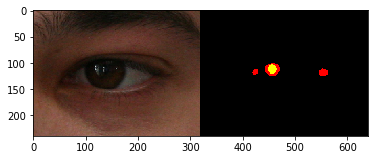

238: Dice Coeff = 0.680948


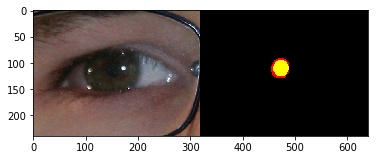

239: Dice Coeff = 0.772002


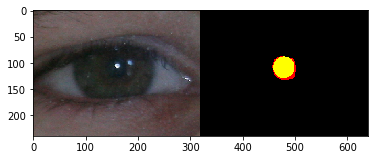

240: Dice Coeff = 0.647343


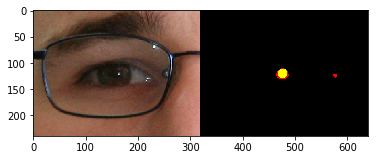

241: Dice Coeff = 0.495637


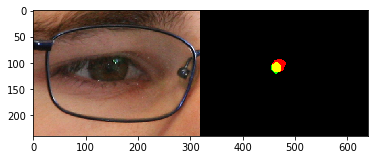

242: Dice Coeff = 0.525764


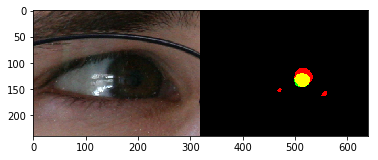

243: Dice Coeff = 0.677057


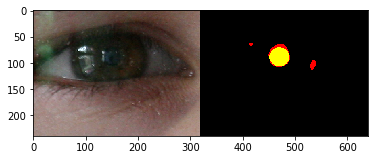

244: Dice Coeff = 0.537037


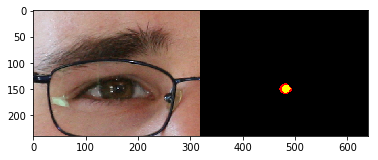

245: Dice Coeff = 0.678862


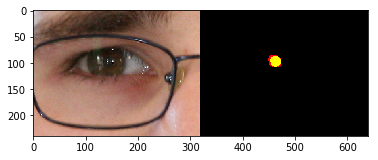

246: Dice Coeff = 0.841734


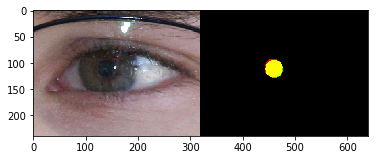

247: Dice Coeff = 0.775046


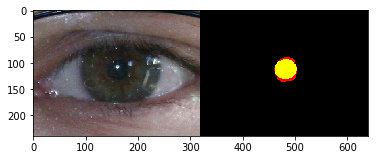

248: Dice Coeff = 0.727273


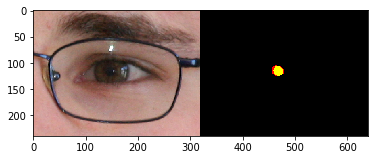

249: Dice Coeff = 0.656489


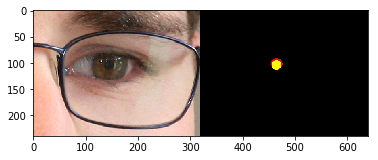

250: Dice Coeff = 0.719231


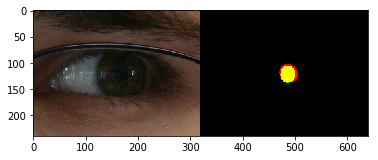

251: Dice Coeff = 0.296558


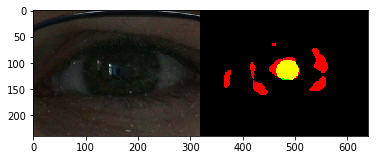

252: Dice Coeff = 0.701923


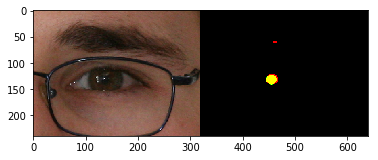

253: Dice Coeff = 0.864865


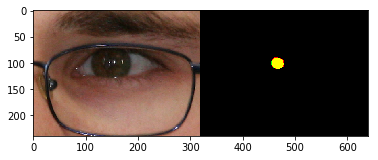

254: Dice Coeff = 0.557594


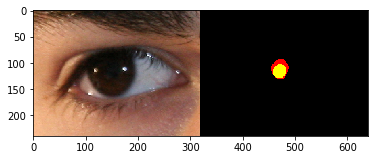

255: Dice Coeff = 0.465333


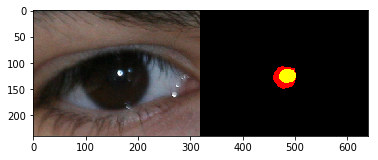

256: Dice Coeff = 0.524116


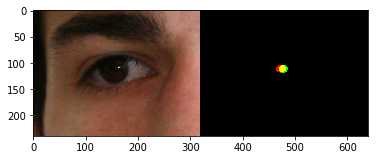

257: Dice Coeff = 0.753695


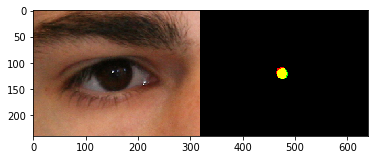

258: Dice Coeff = 0.487788


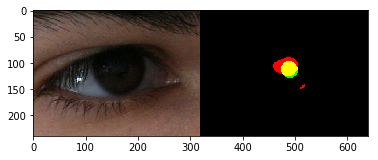

259: Dice Coeff = 0.704931


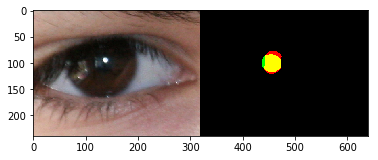

260: Dice Coeff = 0.477723


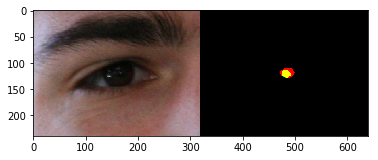

261: Dice Coeff = 0.533246


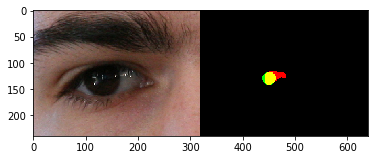

262: Dice Coeff = 0.634017


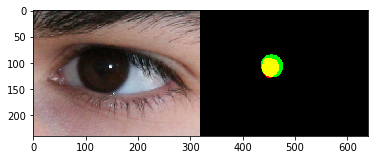

263: Dice Coeff = 0.684982


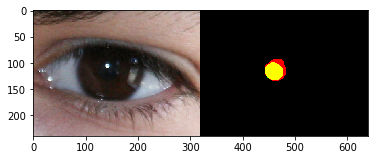

264: Dice Coeff = 0.612069


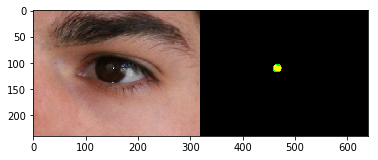

265: Dice Coeff = 0.715499


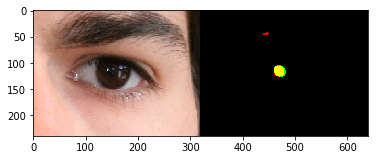

266: Dice Coeff = 0.345658


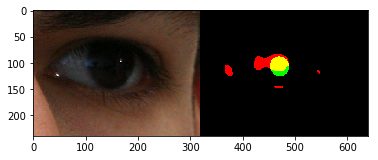

267: Dice Coeff = 0.699355


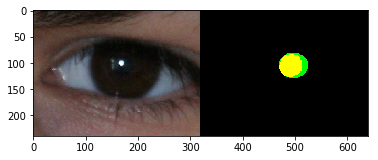

268: Dice Coeff = 0.161056


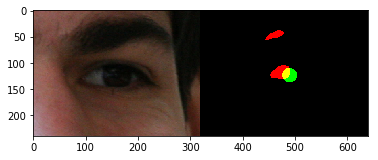

269: Dice Coeff = 0.530928


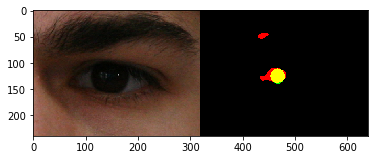

Dice eval av. : 0.664870


In [13]:
    from PIL import Image
    import matplotlib.pyplot as plt

    n = 0
    dice_eval = []
    
    for i in range(len(fpaths_xs_test)):
        # テスト画像
        im1 = Image.open(fpaths_xs_test[i])
        im1 = im1.resize((320,240)) 
        # 出力結果
        im2 = Image.open(os.path.join(dname_outputs, "%05d.png"%(n)))
        im2 = im2.resize((320,240))
        # Grond Truth
        im3 = Image.open(fpaths_ys_test[i])
        im3 = im3.resize((320,240))

        im2_d = np.zeros((240,320,3), 'uint8')
        im2_d[:,:,0] = np.array(im2)
        im2_d[:,:,1] = np.array(im3)*255
        im2_d[:,:,2] = 0

        # Compute dice coeff
        overlap_a = (np.array(im2)/255) * np.array(im3)
        overlap_a[overlap_a > 1] = 1            
        overlap_b = (np.array(im2)/255) + np.array(im3)
        overlap_b[overlap_b > 1] = 1
        print('%03d: Dice Coeff = %f'%(i, sum(sum(overlap_a))/sum(sum(overlap_b))))
        dice_eval.append(sum(sum(overlap_a))/sum(sum(overlap_b)))

        plt.imshow(np.hstack((np.array(im1),np.array(im2_d))))
        plt.show()

        n = n + 1
    
    print('Dice eval av. : %f'%np.mean(np.array(dice_eval)))

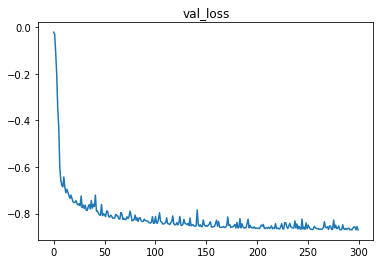

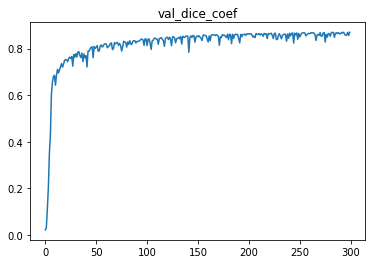

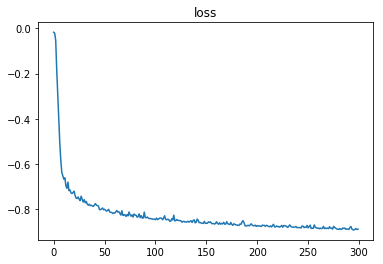

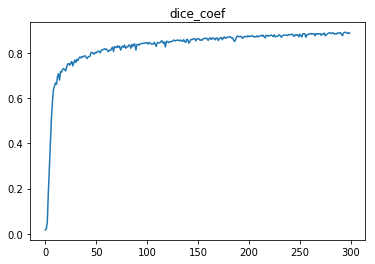

In [64]:
#
#   Show History
#
mode = "SHOW_HISTORY"
if mode == "SHOW_HISTORY":
    # load pickle
    history = pickle.load(open('history.pkl', 'rb'))
    
    for k in history.keys():
        plt.plot(history[k])
        plt.title(k)
        plt.show()


dict_keys(['val_loss', 'val_dice_coef', 'loss', 'dice_coef'])
